Pictures were taken from here

https://github.com/Dyakonov/DL/blob/master/2022/DL_2CV_03archipart2_202204a.pdf

# LeNet-5

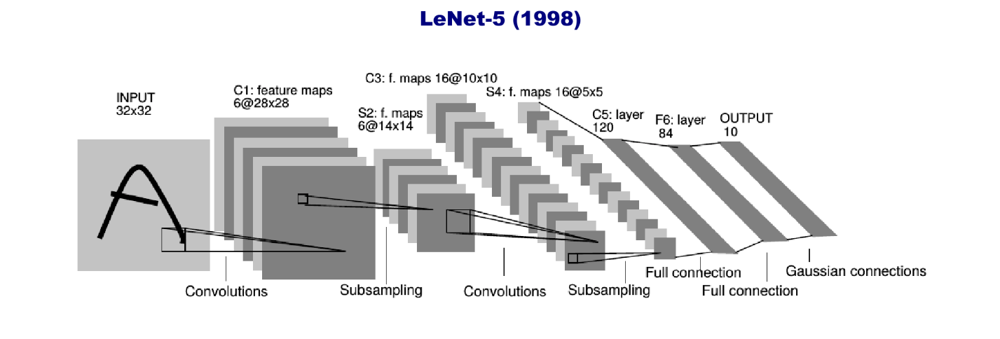

5 layers: 2 Conv (5x5) + 3 FC

Activation function: tanh

Pooling: AvgPool

# AlexNet

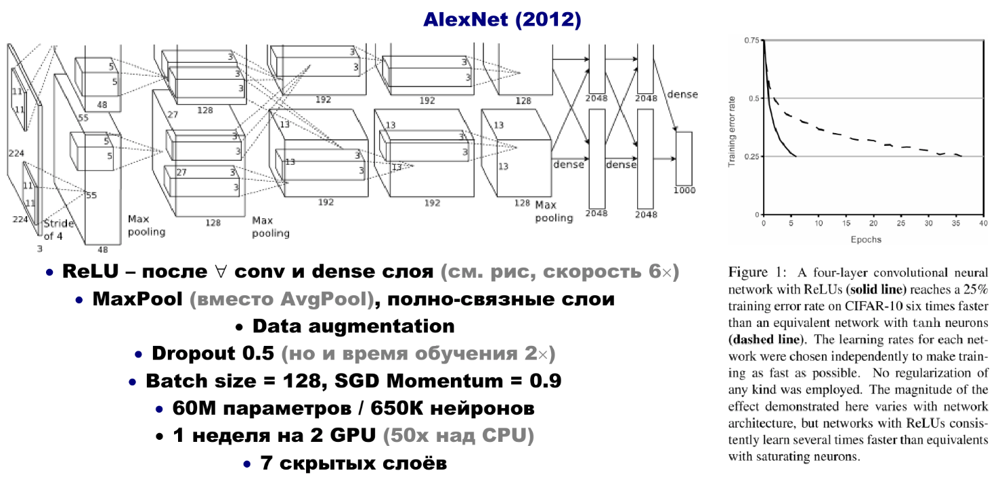

8 layers: 5 Conv (3x3, 5x5, 11x11) + 3 FC

Activation function: ReLU

Pooling: MaxPool

Dropout 0.5, SGD + Momentum=0.9, Batch size=128

# VGG

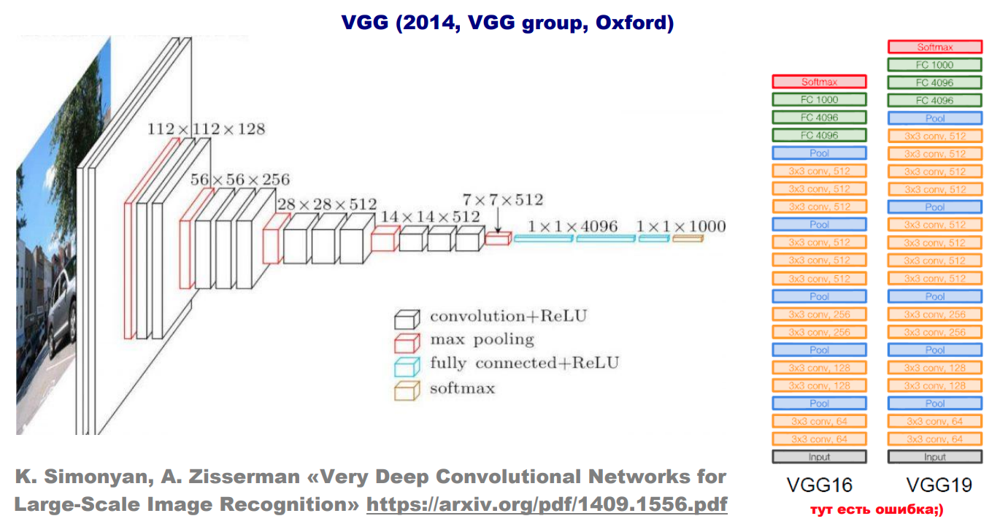

8 layers: 5 Conv (3x3) + 3 FC

Activation function: ReLU

Pooling: MaxPool

Dropout 0.5, SGD + Momentum=0.9, Batch size=256, LR=0.01, 3x3 Convolution Cascade (replace for 7x7 conv).

### Convolution Cascade

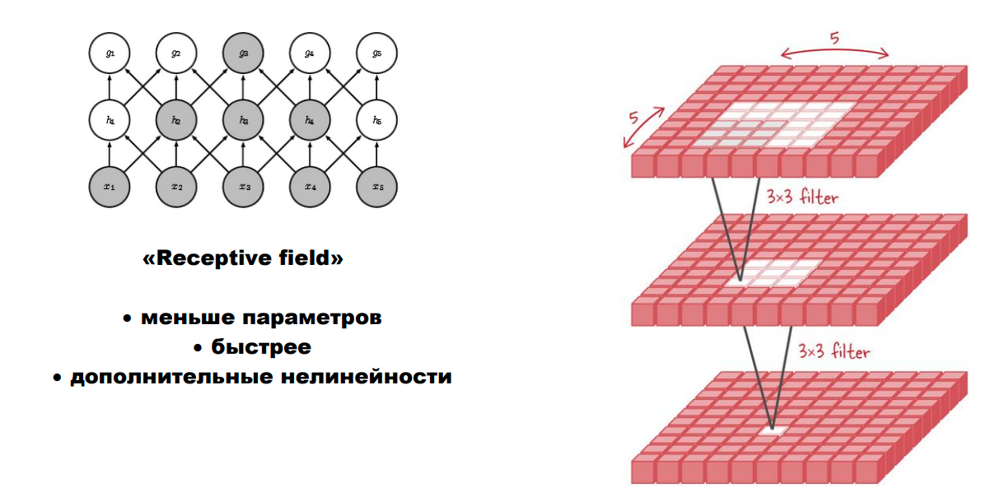

For example, two consecutive convolutions 3x3 can replace 5x5 convolution, but:
- less parameters (one 5x5 conv - 25 params, two 3x3 convs - 18 params)
- faster
- additional nonlinearities

# GoogLeNet / Inception

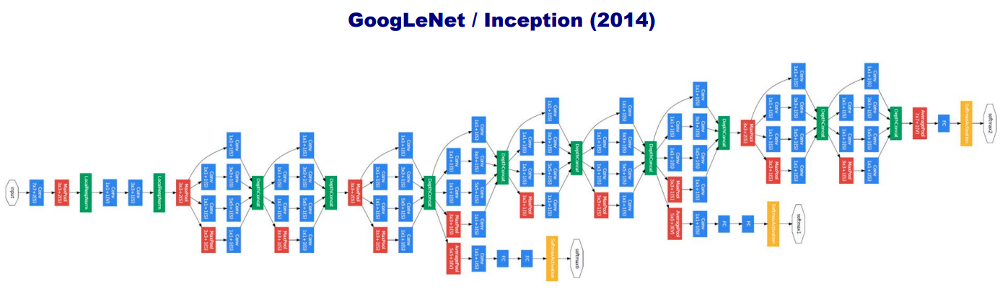

22 layers: All Conv (1x1, 3x3, 5x5), no FC

Activation function: ReLU

Pooling: MaxPool, Average Global Pooling (instead of FC)

Additional classifier outputs (weight 0.3 to total loss), Module architechture

### Inception modules

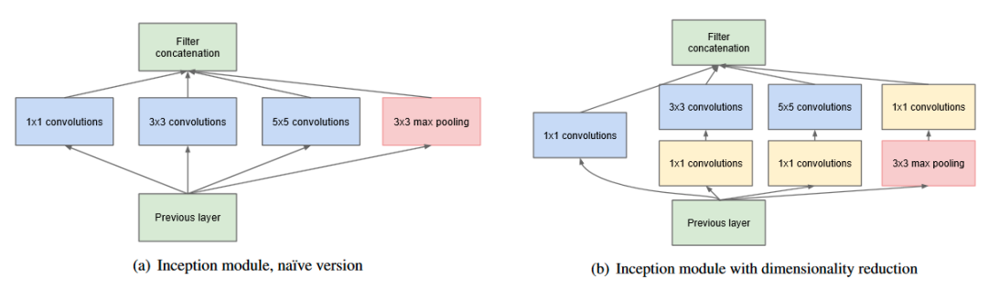

Main idea: different convs + pooling

### Inception v2 and v3 modules

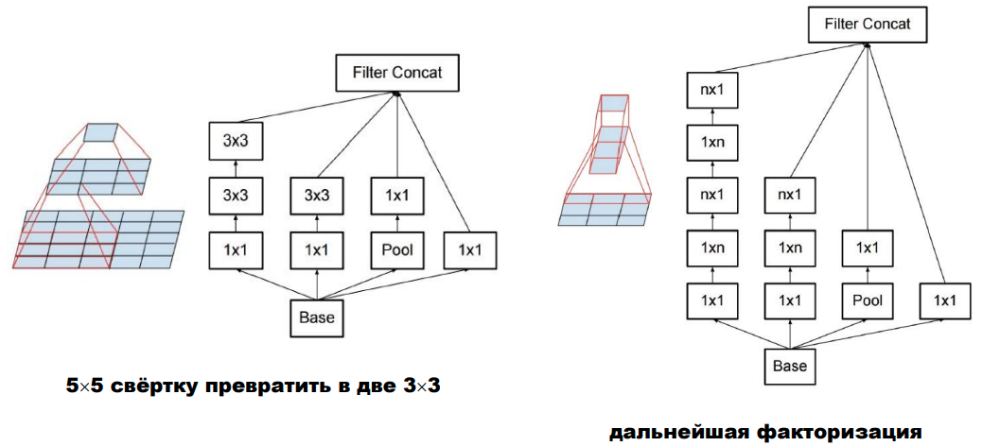

Add Batch Normalization

v2: 5x5 conv -> two consequtive 3x3 convs

v3: additional Convolution factorization

### Global Average Pooling idea

The idea is to generate one feature map for each corresponding category of the classification task in the last mlpconv layer. Instead of adding fully connected layers on top of the feature maps, we take the average of each feature map, and the resulting vector is fed directly into the softmax layer. 


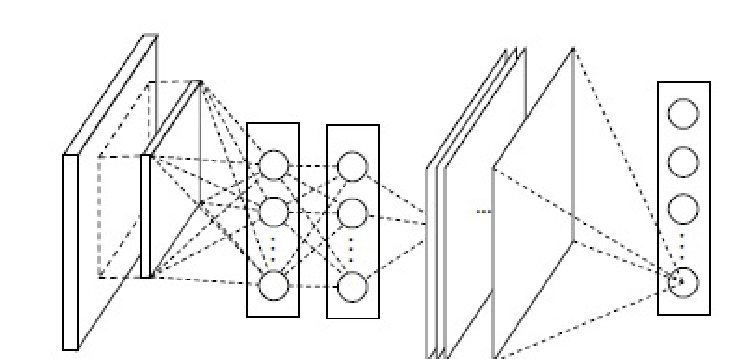
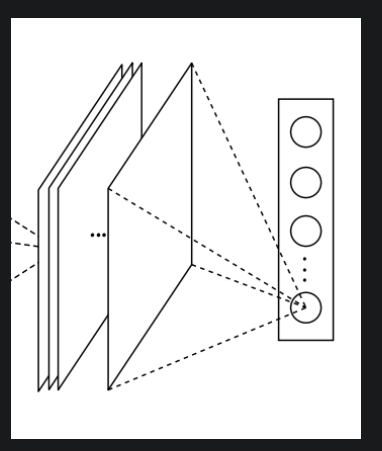

### Convolution factorization/separation idea

Factorized/separable convolution is a convolution, that can be factorized to product of simpler convolutions (like Depthwise + Pointwise convolution). That is used to decrease the number of model parameters.

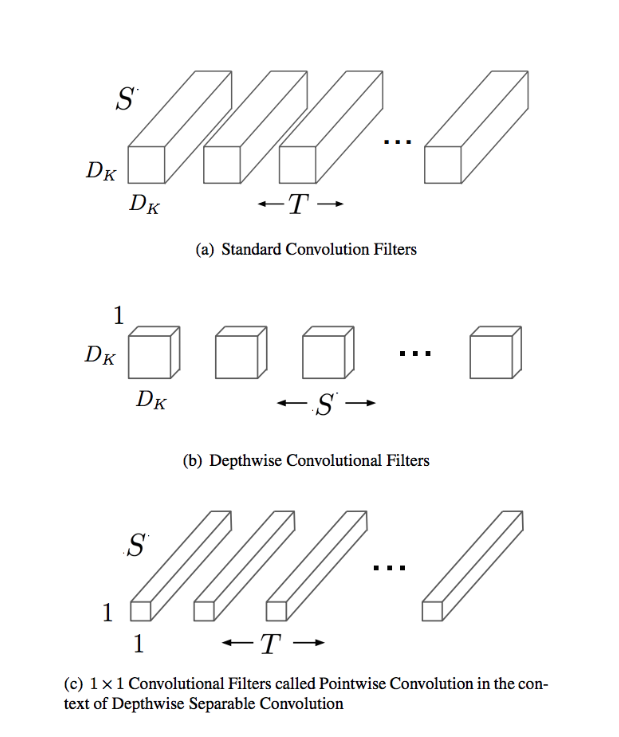

More info here

http://stanford.edu/class/ee367/Winter2019/bergman_report.pdf

# MLPconv

Main idea: instances of the same concept often live on a nonlinear manifold and linear convolution filter in that cases should be replaced with an MLP.  This new type of layer is called mlpconv in [ 41], where MLP convolves over the input. There are two reasons for choosing an MLP. First, an MLP is a general nonlinear function approximator. Second, an MLP can be trained by using back-propagation, and is therefore compatible with conventional CNN models.

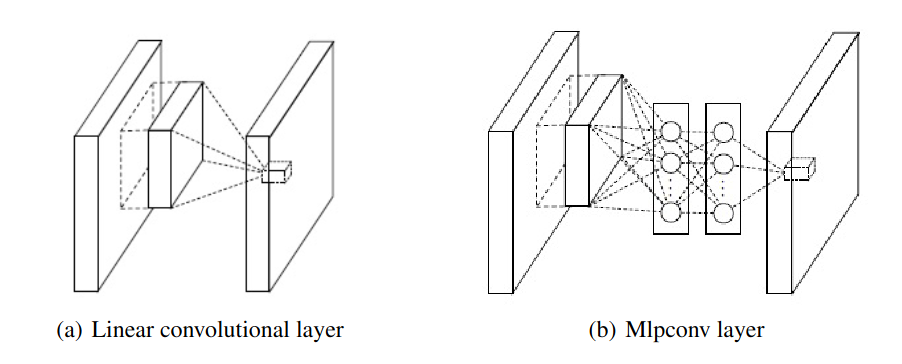

# Depthwise convolution

A type of convolution in which each input channel is convolved with a different kernel (called a depthwise kernel). You can understand depthwise convolution as the first step in a depthwise separable convolution.

It is implemented via the following steps:

- split the input into individual channels.
- convolve each channel with an individual depthwise kernel with depth_multiplier output channels.
- concatenate the convolved outputs along the channels axis.

Unlike a regular 2D convolution, depthwise convolution does not mix information across different input channels.

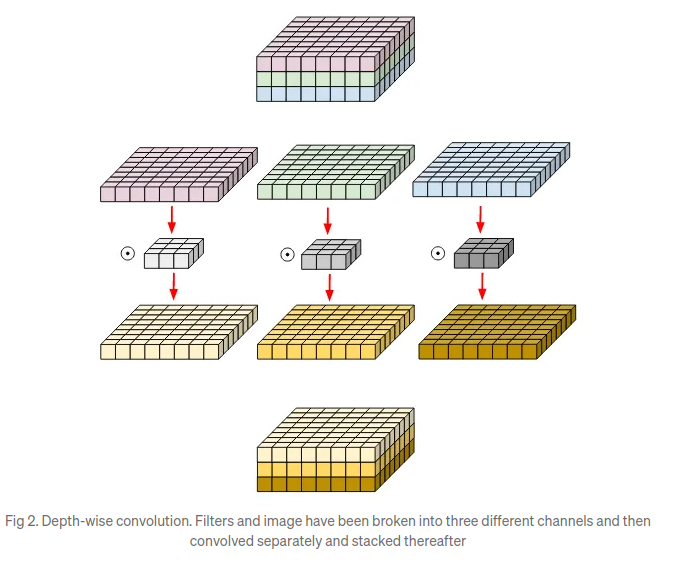

## Transposed convolution

One of ways to restore image size to previous. Just pass the filter through the grid and sum up all filter values in each grid cell.

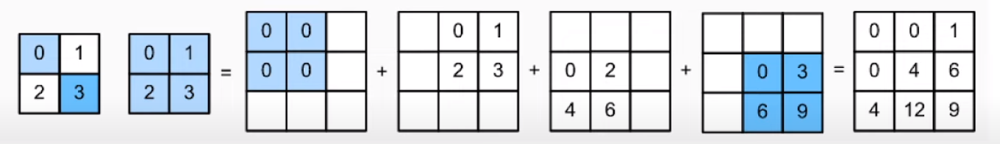

## Fractional-strided convolutions

Transposed convolution + stride. White cells are zero rows/columns padded between the input cells (blue).

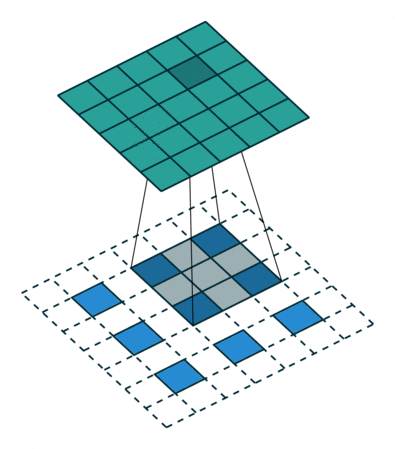

# Pixel Shuffle

PixelShuffle is an operation used in super-resolution models to implement efficient sub-pixel convolutions with a stride of 1/r. Specifically it rearranges elements in a tensor of shape (*, C x r<sup>2</sup>, H, W) to tensor (**, C, H x r, W x r)

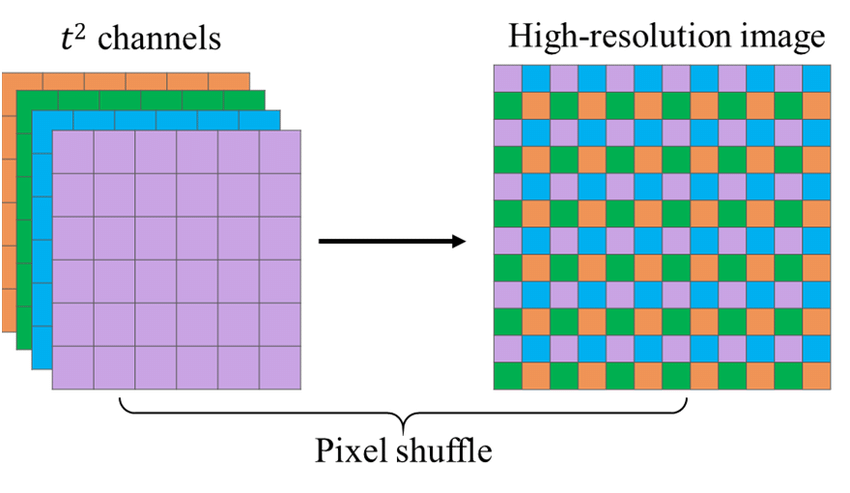

## Dilated convolution

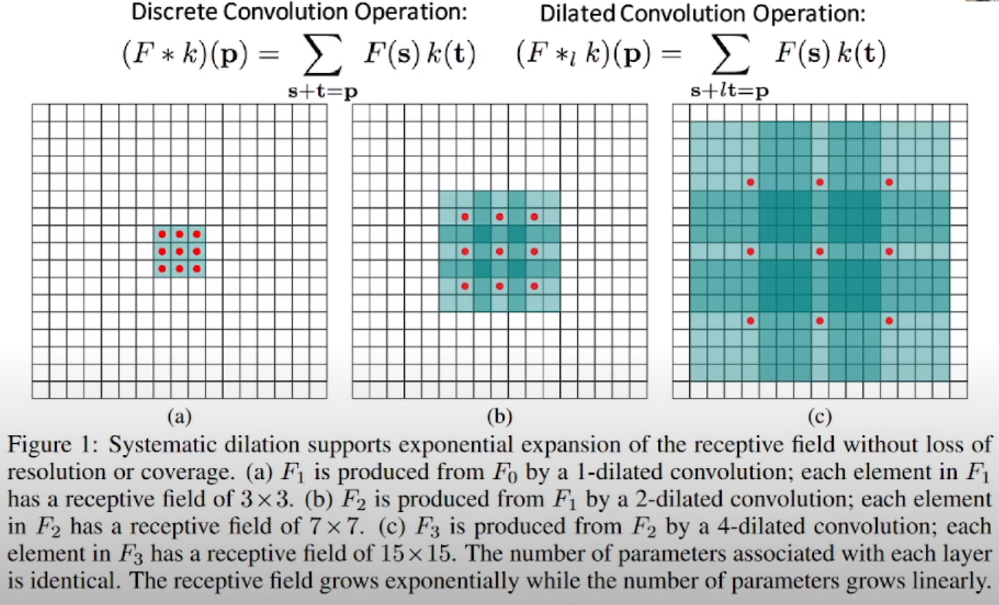

# ResNet

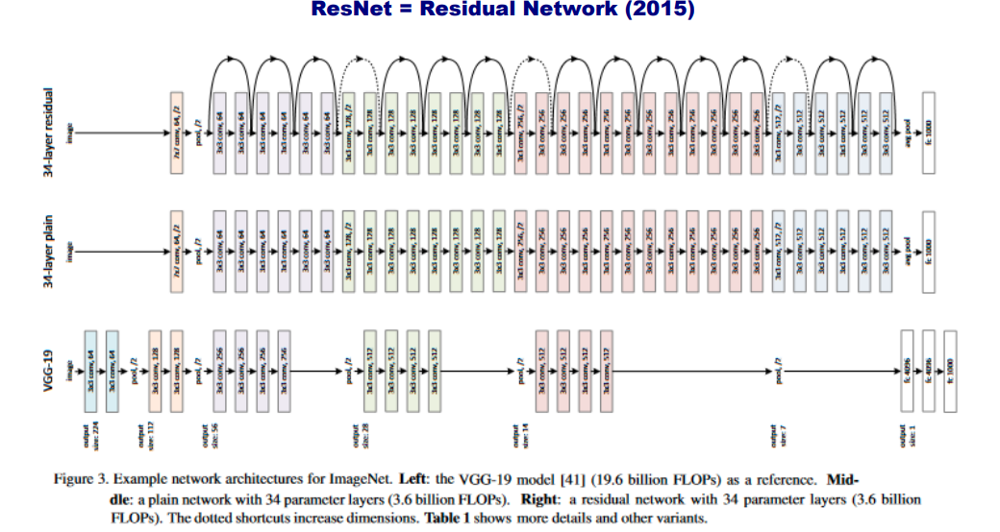

up to 152 layers: All Conv (1x1, 2x2, 3x3, 4x4, 5x5), except last FC

Activation function: ReLU

Pooling: MaxPool, Average Global Pooling (instead of FC)

No Dropout, Batch Norm (after Conv, before activation), Skip connections, SGD + Momentum=0.9, Batch size=256



### ResNet module

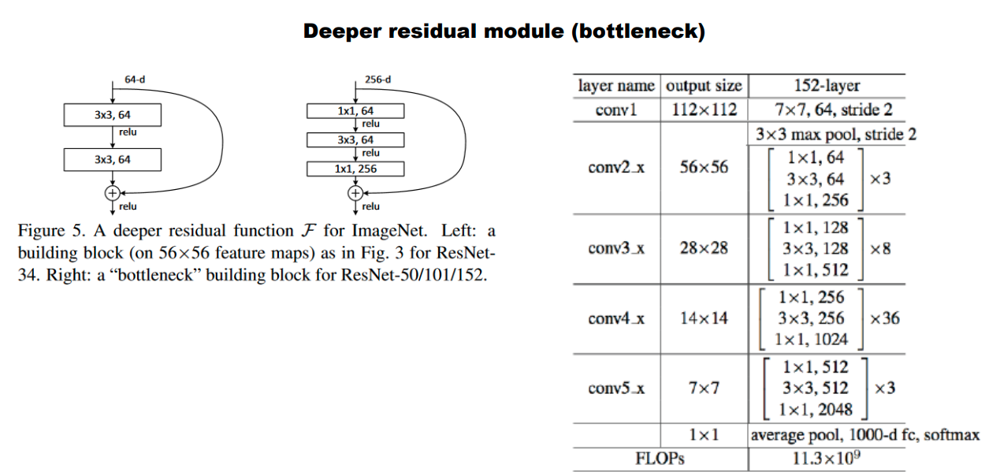

Skip connections make surface of loss function much smoother

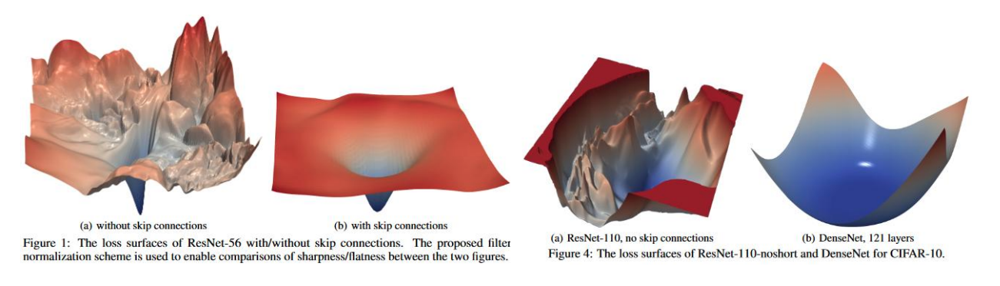

# Inception-V4

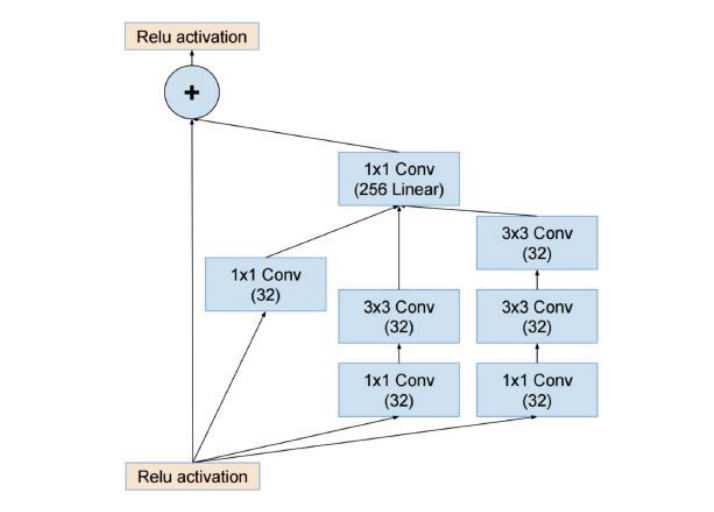

Inception-V3 + Resnet

# Xception

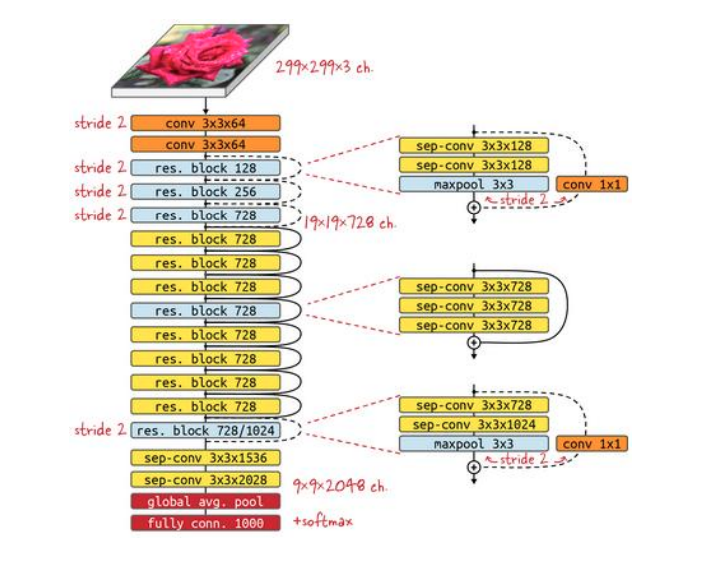

Resnet + Separable Convolutions

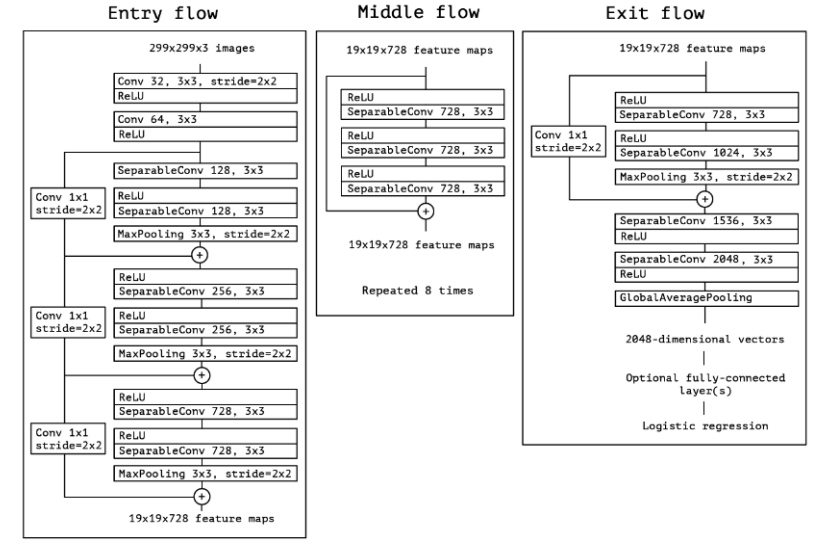

# SENet

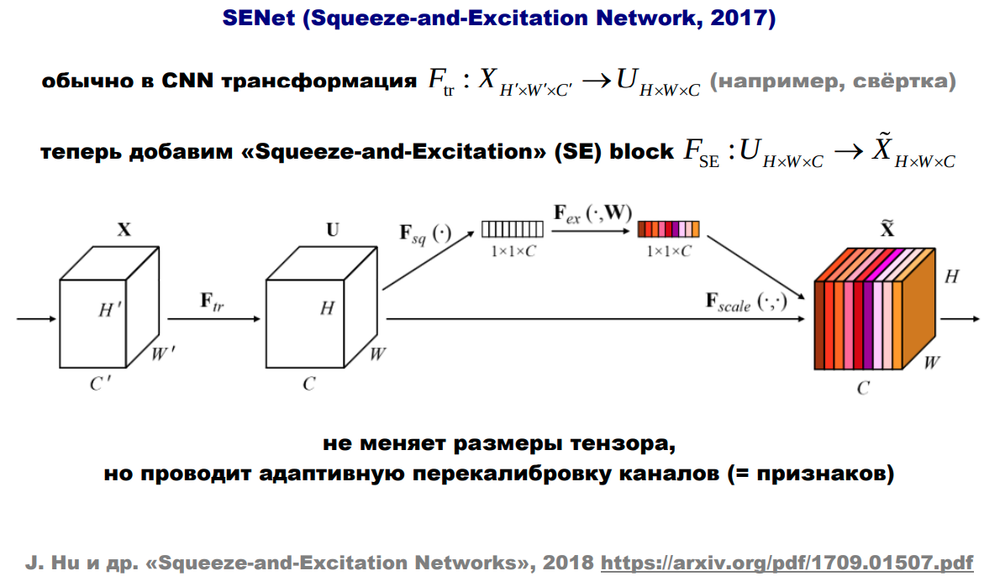

Add SE (Squeeze-and-Excitation) block. It doesn't change convolution layer size, but add adaptive channel rescale.

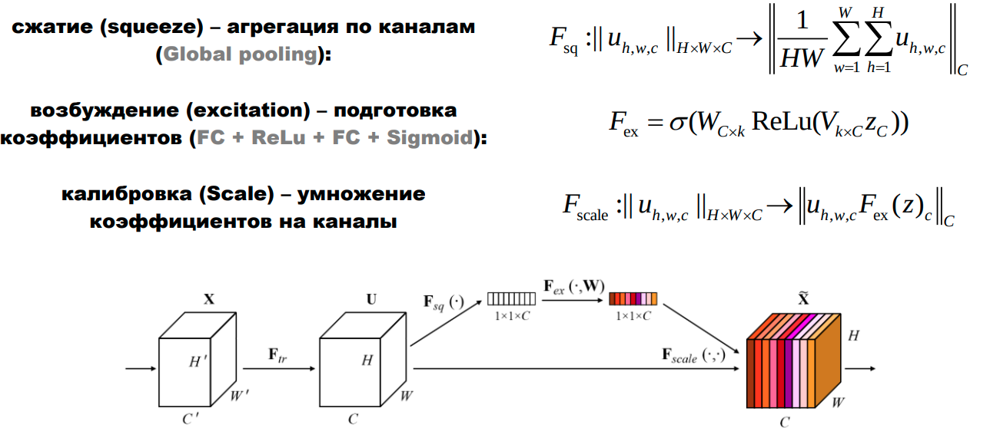

Squeeze - channel aggregation (Global Pooling)

Excitation - prepare channel coefficients (FC + ReLU + FC + Sigmoid)

Scale - every channel is multiplied by it's own coefficient

SE-block is an example of self-attention and bottleneck. It increases NN's representation power and lets interchannel dependencies using. Also it implements channel selection (like LASSO), increases important channel values and decreases unimportant.

### Network in Network

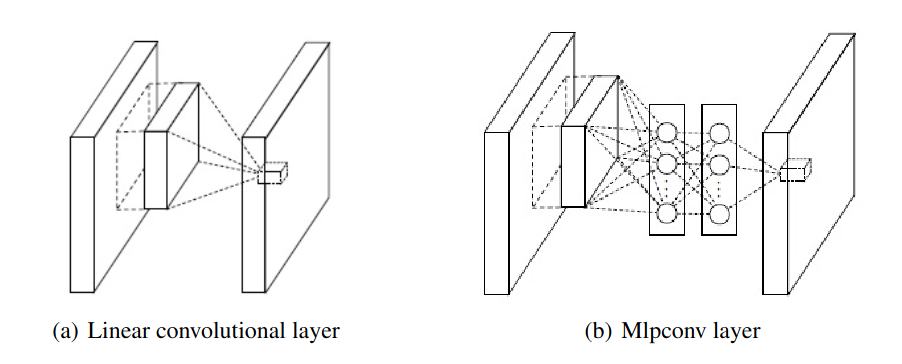

Convolution is replaced with MLP

### Stochastic Depth

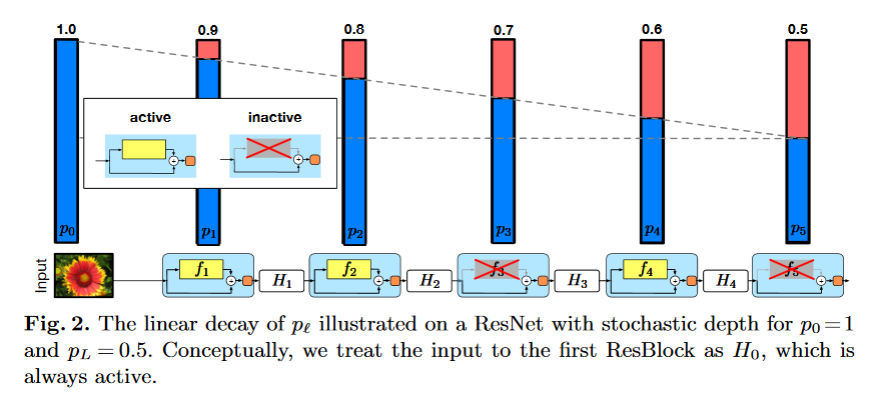

Randomly delete subset of layers and replace them with skip connections on each iteration of training process

# DenseNet.

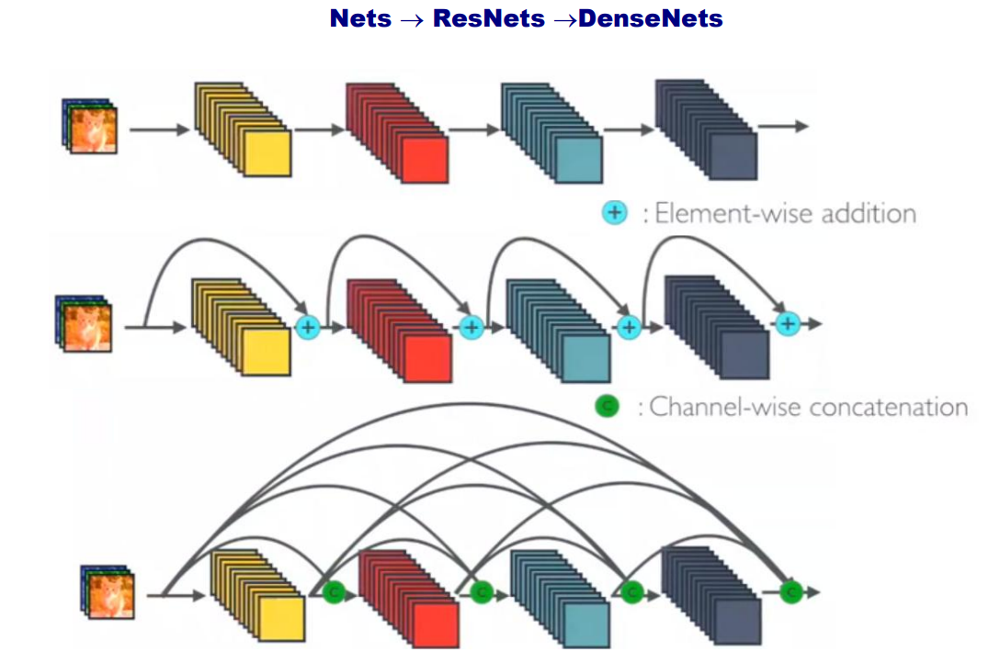

Simple NN: Z<sub>i</sub> = F<sub>i</sub>(Z<sub>i-1</sub>)

ResNet: Z<sub>i</sub> = F<sub>i</sub>(Z<sub>i-1</sub>) + Z<sub>i-1</sub>

DenseNet: Z<sub>i</sub> = F<sub>i</sub>(Z<sub>i-1</sub>, Z<sub>i-2</sub>, ..., Z<sub>0</sub>)

F = BN + ReLU + convolution + dropout

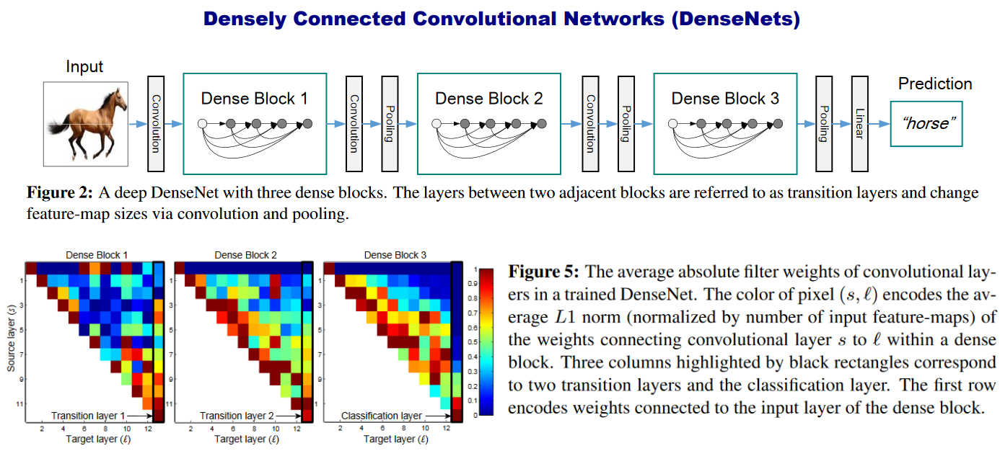

# ResNeXt

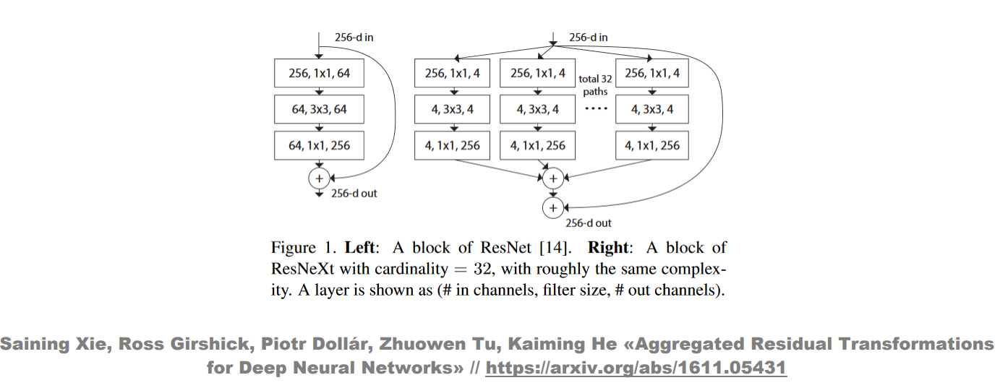

Same number of parameters as ResNet has, but one more parameter added - cardinality. Also bottleneck is used.

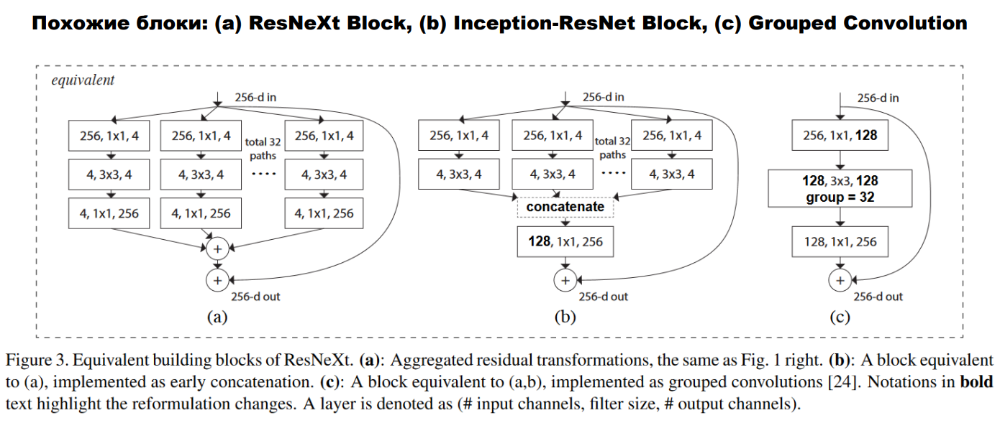

Similar blocks: ResNeXt Block (a), Inception-ResNet Block (b), Grouped Convolution (c)

Basically, ResNext block is a ResNet block with Group Convolution.

### Split-transform-aggregate strategy. 

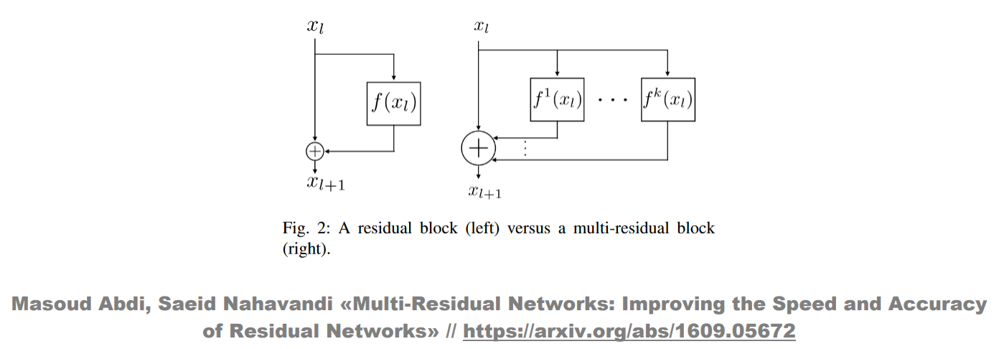

Is used in ResNext, MultiResNet, PolyNet

### Dynamic Convolution

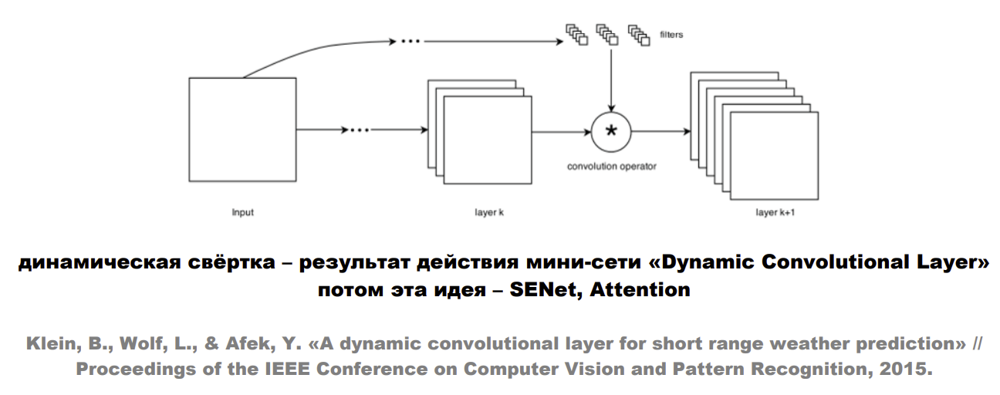

Idea: use special mini-NN "Dynamic Convolutional Layer" as convolutional layer. It can change conv filters according to the image part that it processes. Dynamic convolution improve main NN performance but it's heavier and slower that simple convolution

# Hyper Net

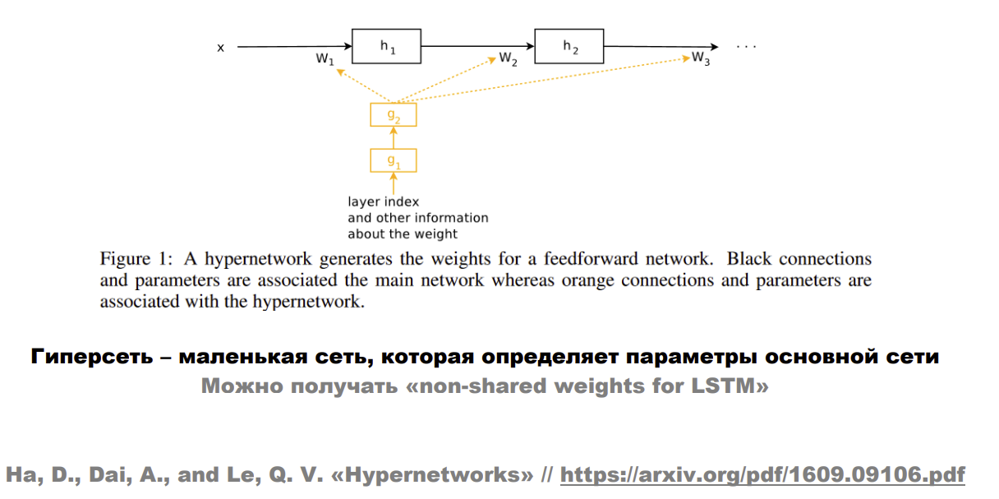

Hyper Net - is a small net (marked with orange color on the picture) that defines parameters of the main net.

# EfficientNet

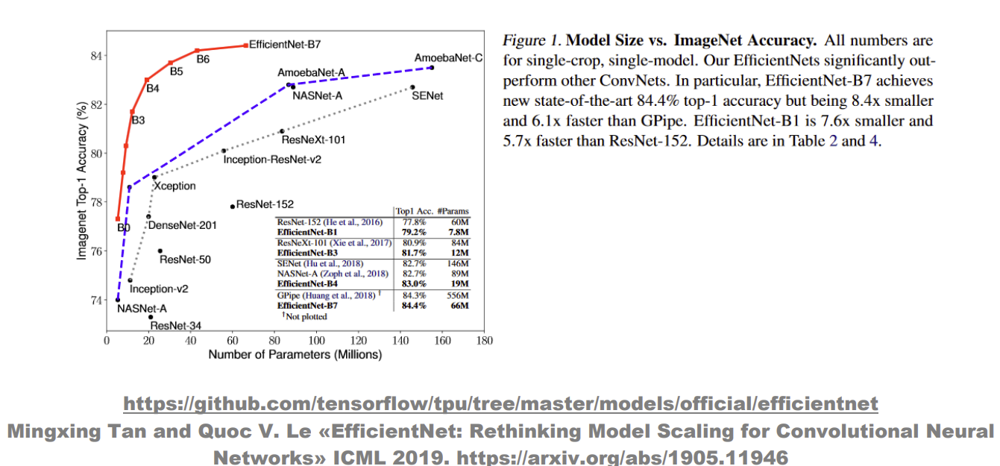

Main idea: effective scaling of the Conv NN

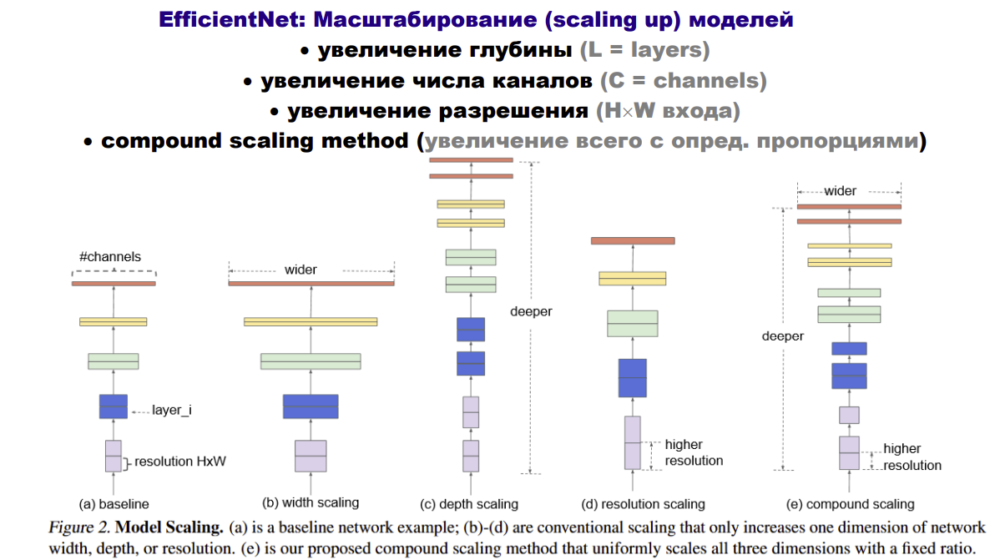

Finding the right proportion for the number of layers (L), channels (C) and resolution (r) significally increases NN performance.

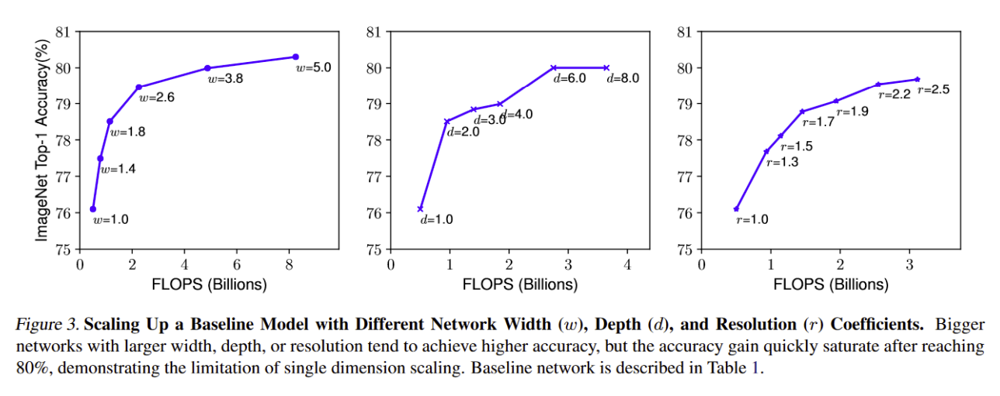

L, C and r are denoted as some numbers alpha, beta and gamma in power of another number phi. 

alpha * betta * gamma ~ 2

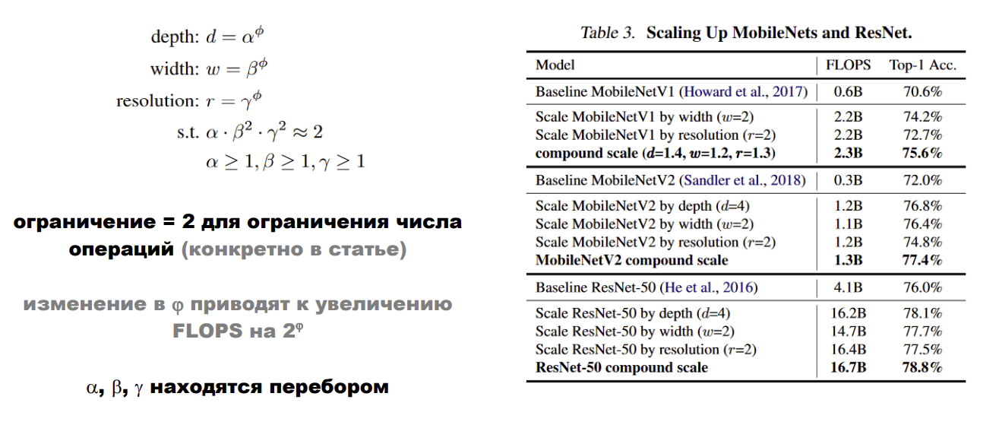

Increasing of phi leads to increasing of NN FLOPS on 2^phi

Alpha, betta and gamma are found through grid search.

# WideResNet

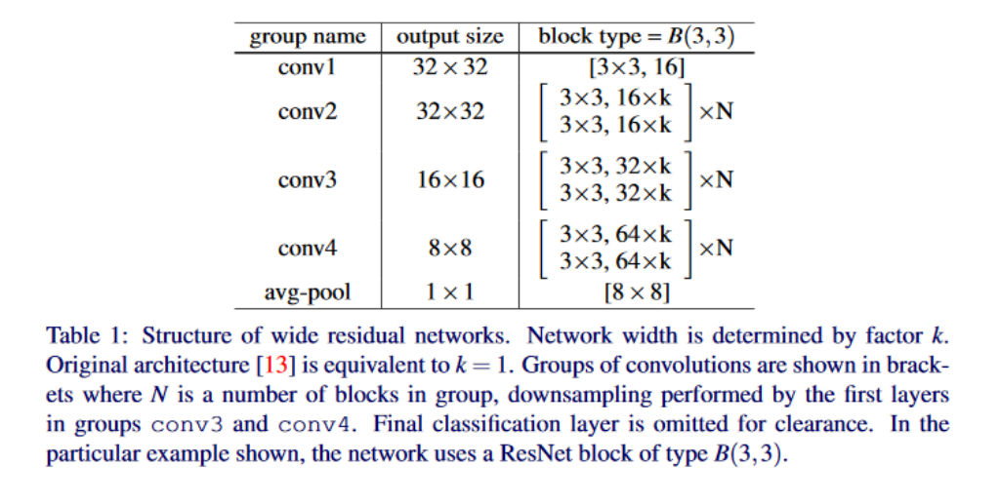

Parameter k defines net's width and it's the main parameter for optimization.

WideResNet vs ResNet

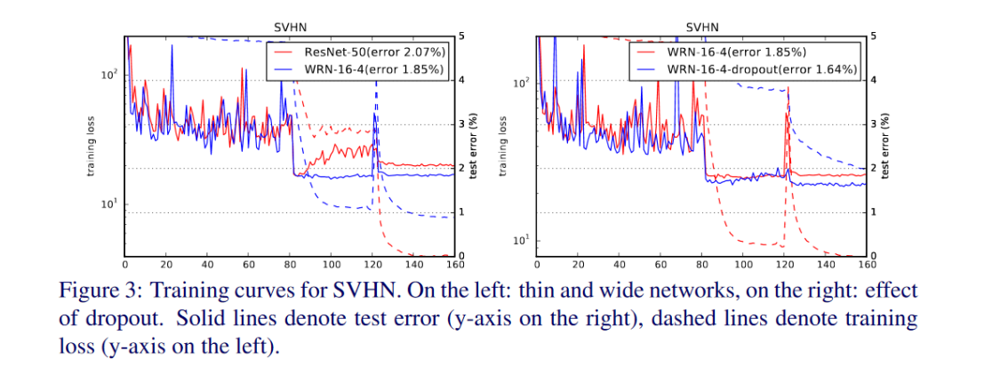

# NFNets - Normlization Free Networks

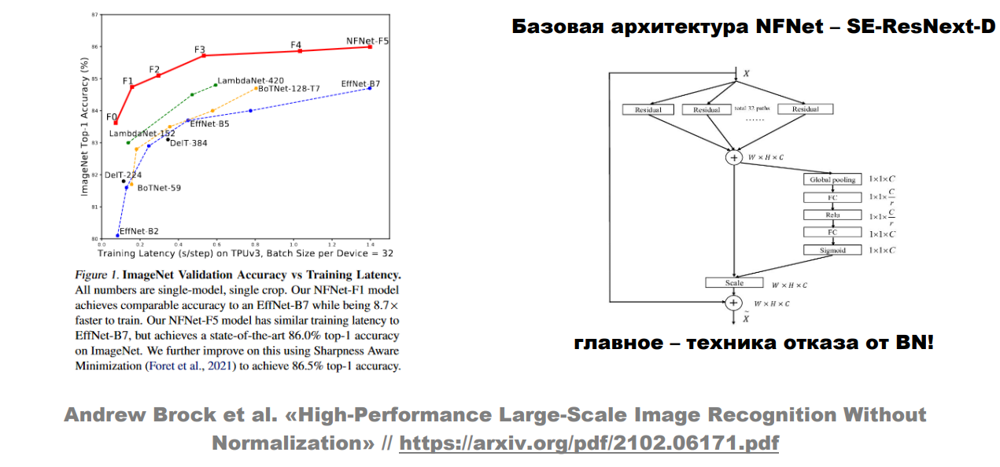

- main idea: don't use BN, cause it consumes a lot of time and memory, behaves differently during train and test, depends on Batch Size, etc.

- special formula with parameters alpha and beta is used Instead of BN. These paramers depend on train/test data.

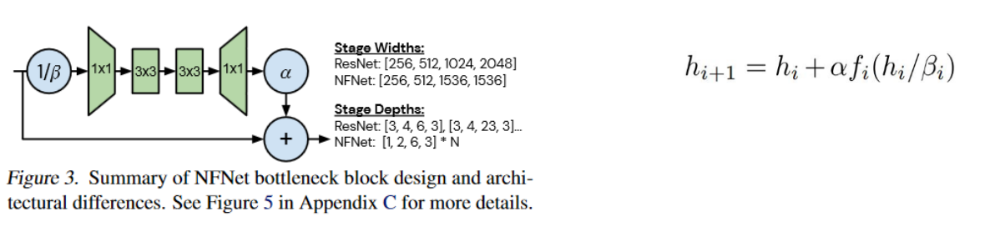

- adaptive gradient clipping - if gradient norm is more than *lambda* times more than weight norm, than clip it with lambda. Lambda is picked up. These technique helps reach high accuracy and performance without normalization and also allows using of some augmentations.

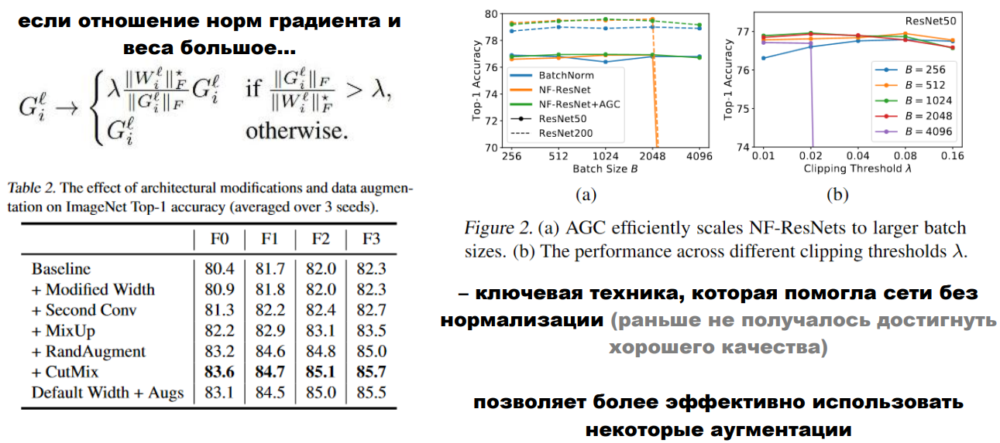


- smallest NFNet model has the same accuracy as EfficientNet-B7 but trains 8.7 times faster
- biggest NFNet model has SOTA top-1 accuracy = 86.5% on ImageNet dataset

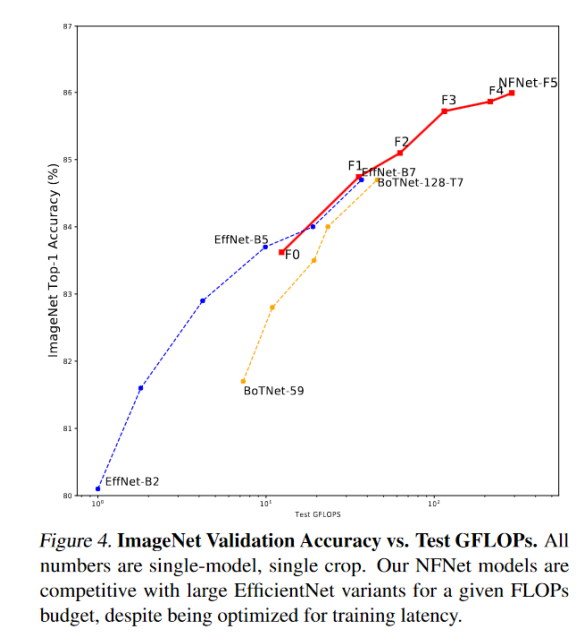

# ConvNeXt

- ResNet + latest transformer tricks = conv architechture that outperfoms transformer


Tricks
- 300 epochs
- AdamW
- Mixup, Cutmix, RandAugment, RandomErasing augmentations
- regularization (stochastic depth, label smoothing)
- GeLU instead of ReLU
- LayerNorm (normalize all pixels and channels for every object in the batch)
- inverted bottleneck
- depthwise convolutions
- 4x4 convolutions with stride=4, also 7x7 convolutions

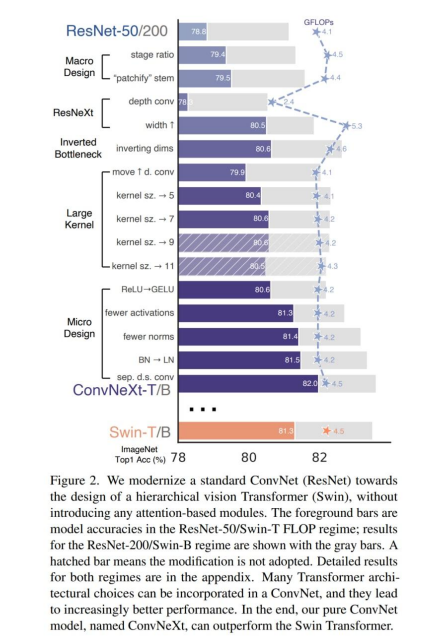

ConvNeXt block

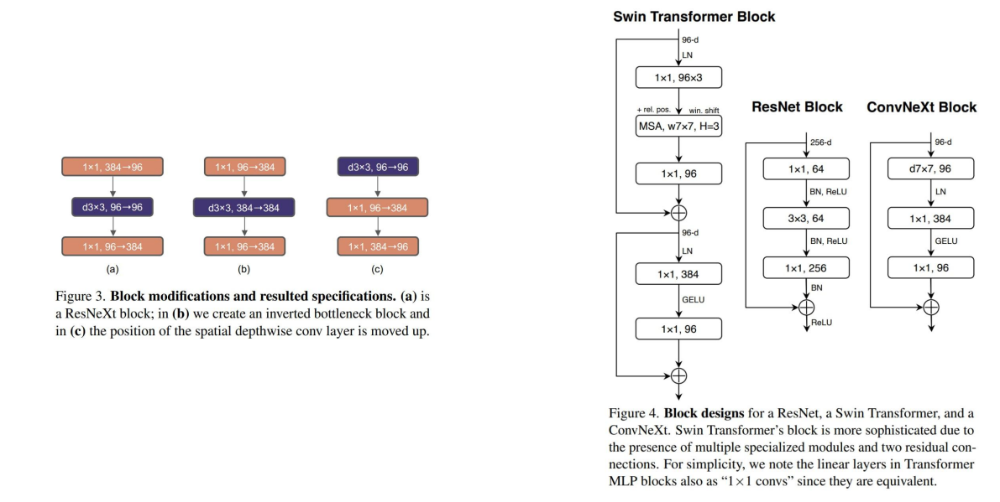

# Mobile Nets

# MobileNet v1

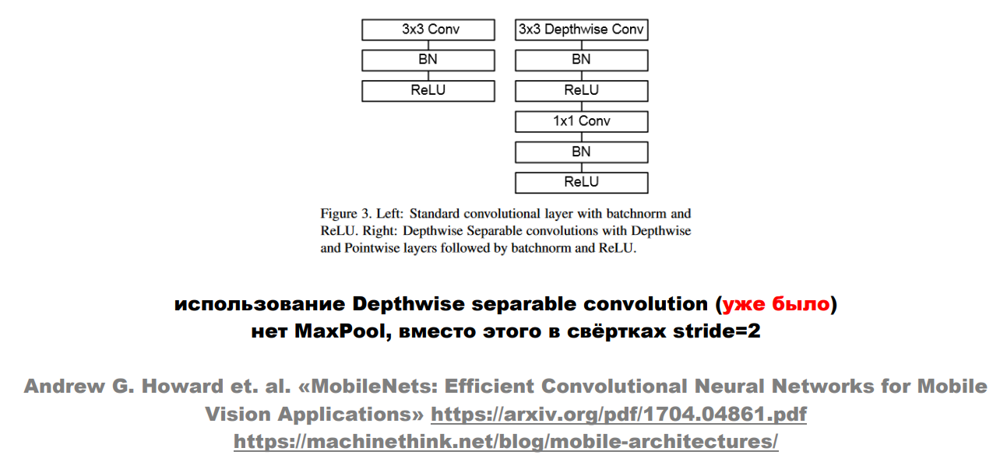

Use Depthwize separable convolution. No MaxPool, use stride=2 instead.

# MobileNet v2

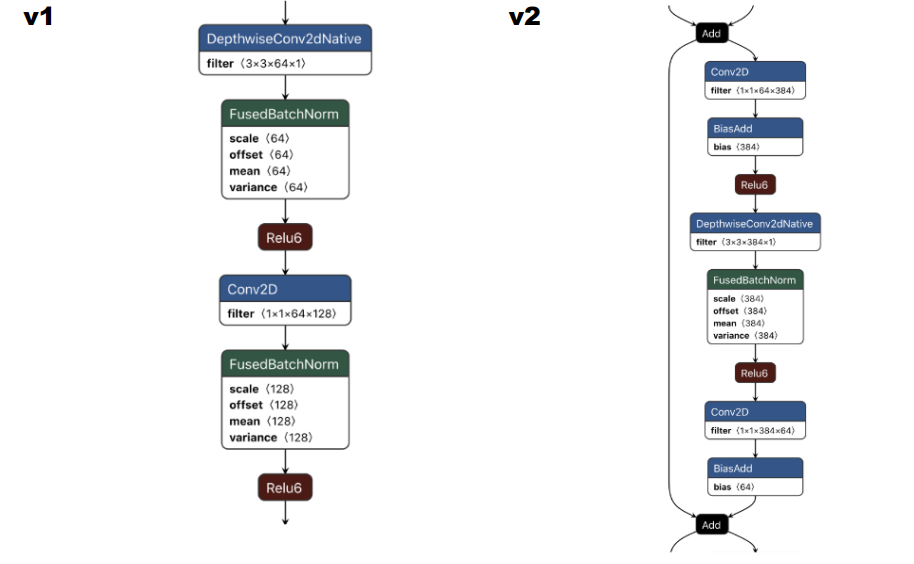

Depthwize conv in the middle and skip connection. ReLU6 is used. ReLU6 = max(0, min(x, 6)) - same as ReLU, but value can't be greater than 6. Capping ReLU by value 6 encourages the model to learn sparse features earlier.


Number of channels increases at first, then decreases (Inverted Residual Bottleneck)

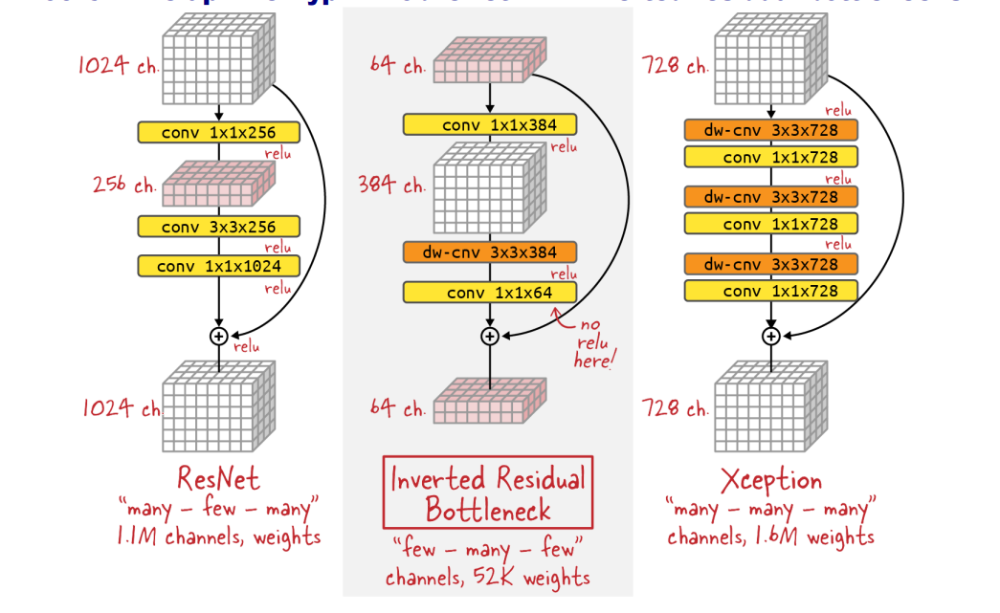

# MobileNet v3

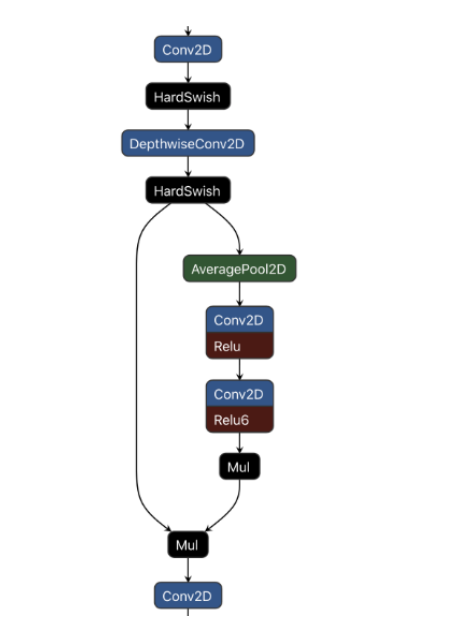

First layer activations are changed to HardSwish = x * ReLU(x + 3)/6

Squeeze-and-Exciation modules added

NN's head is changed to more efficient.

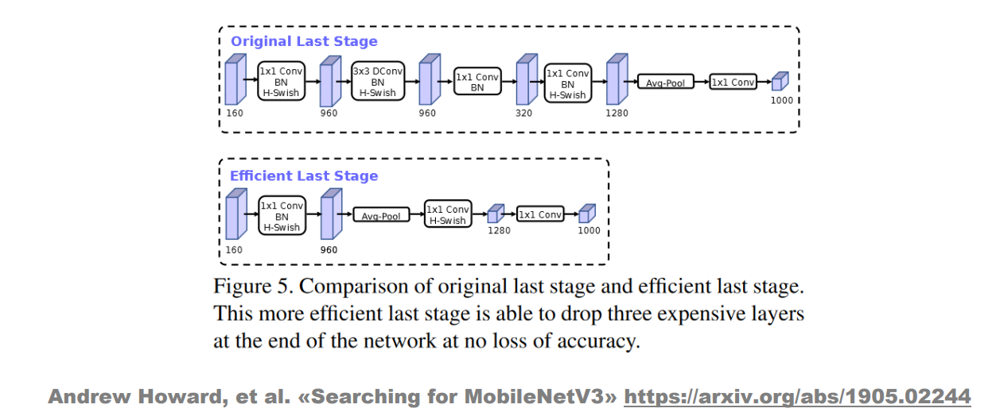

# SqueezeNet

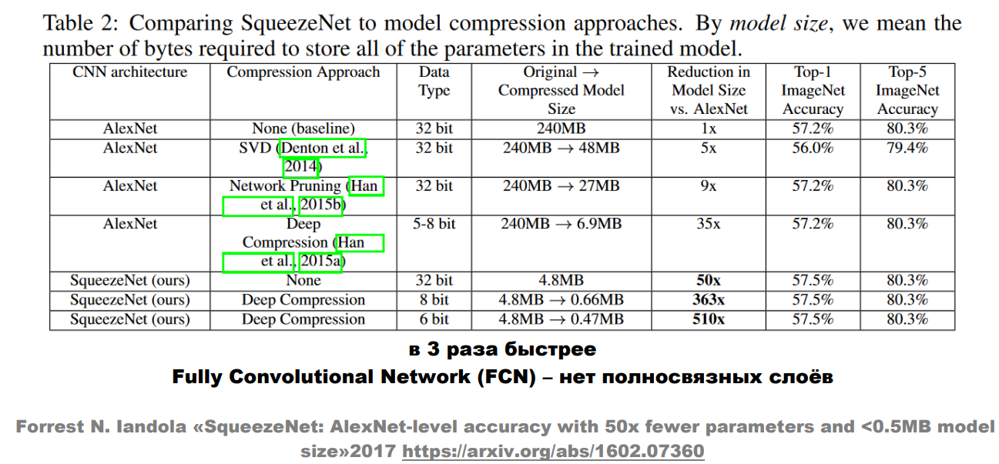

 - use SVD + Network Pruning + Deep Compression => 510x Reduction in model size
 - replace 3x3 convs with 1x1 squeeze modules
 - decrease number of channels between convs
 - increase stride for NNs final layers
 - no FC layers (Global Avg Pool instead)
 - use Fire Module (3 1x1 convs in the squeeze part and 4 1x1 and 3x3 convs in the expand part)

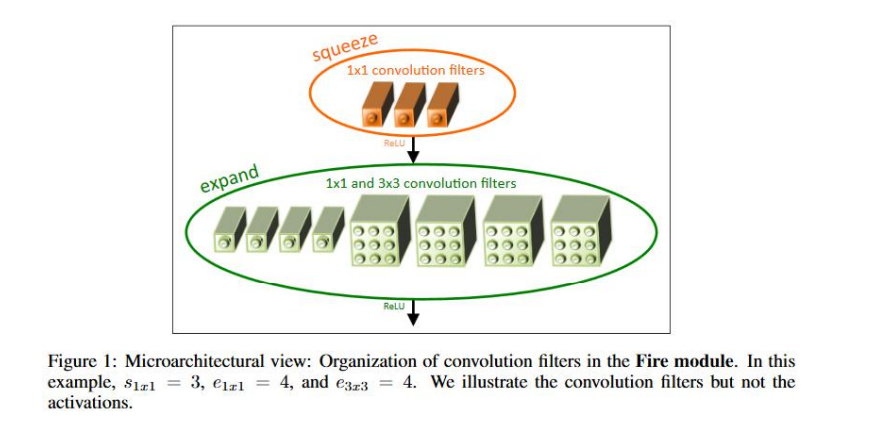

Three types: SN, SN + simple bypass and SN + complex bypass

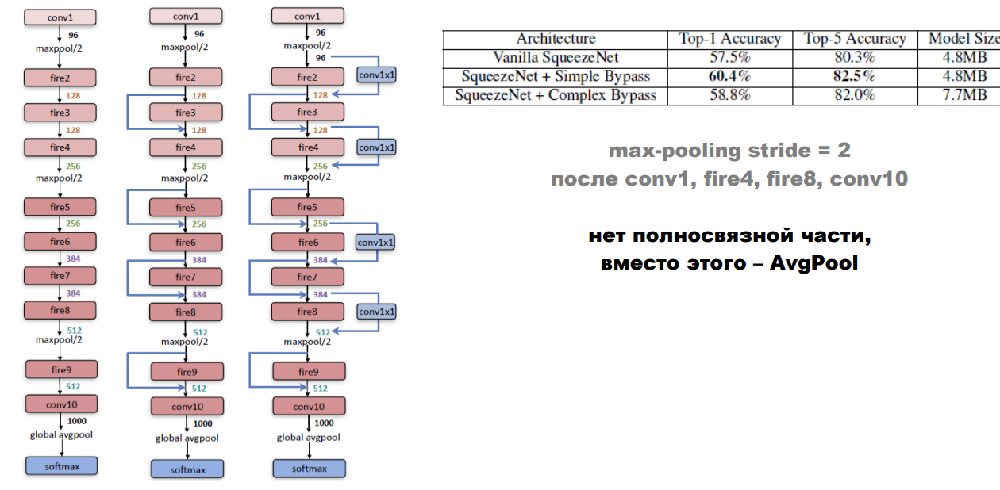


# SqueezeNext

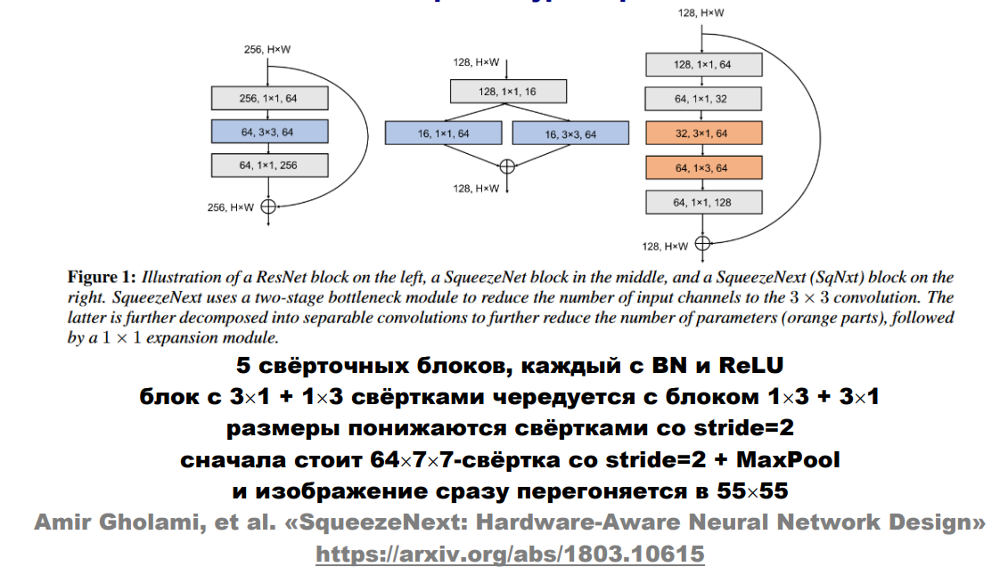

- 5 conv blocks each with BN and ReLU
- blocks with convs 3x1 + 1x3 interleave with blocks with 1x3 + 3x1 convs
- size decreases with convs with stride=2 + MaxPool
- image transforms to size 55x55

# ShuffleNet

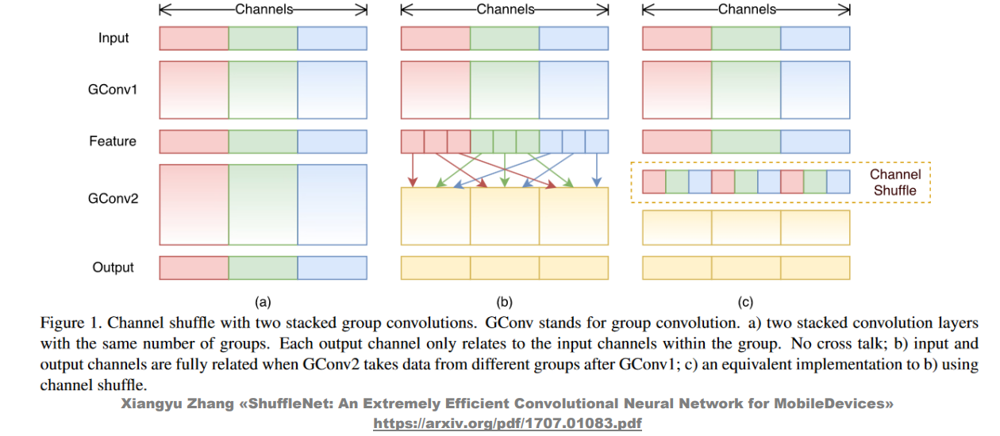

Main idea: shuffle the groups (groups is used to speed up conv operations - they are performed only on group's channels) with special ChannelShuffle module, so NN takes in account the intergroup dependencies.

Main principe of ChannelShuffle module: transform vector to NxM matrice => transpose to MxN matrice => flatten to vector

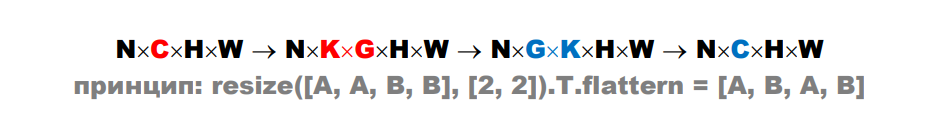



ShuffleNet units

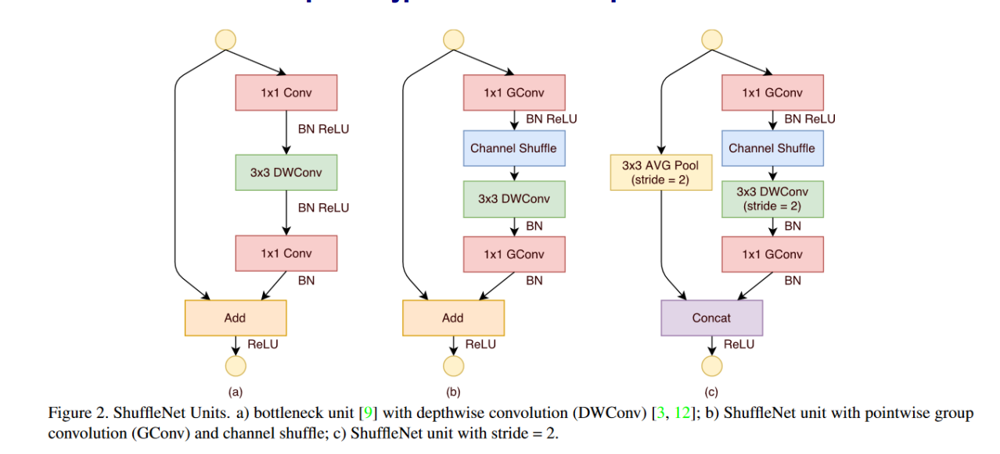

# ShuffleNet v2

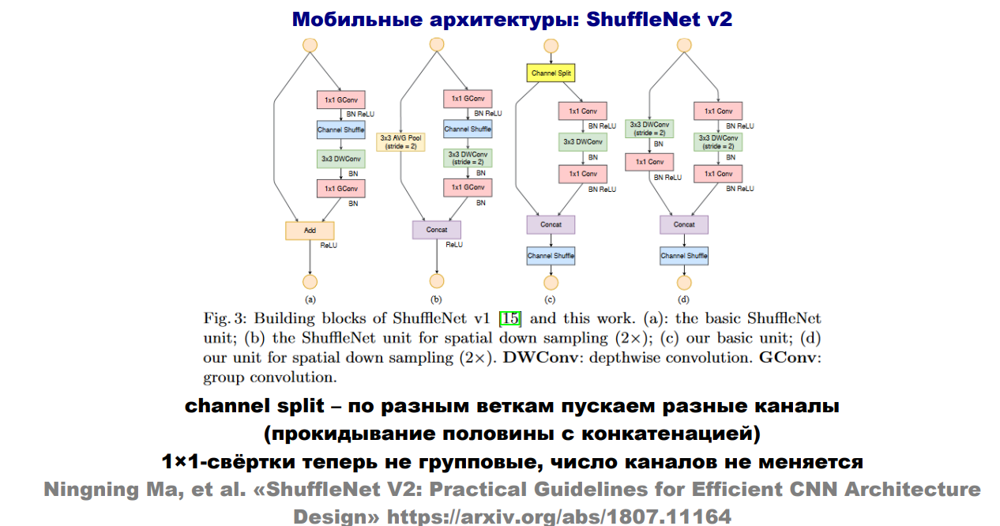

- add ChannelSplit module, that split channels on two groups. First channel group is processed, second channel group remain unchanged. In the end both groups are concatenated and mixed with each other. This trick increases the performance because on every iteration only half of channels is processed.
- 1x1 conv modules are not group anymore

# All main CNN architechtures

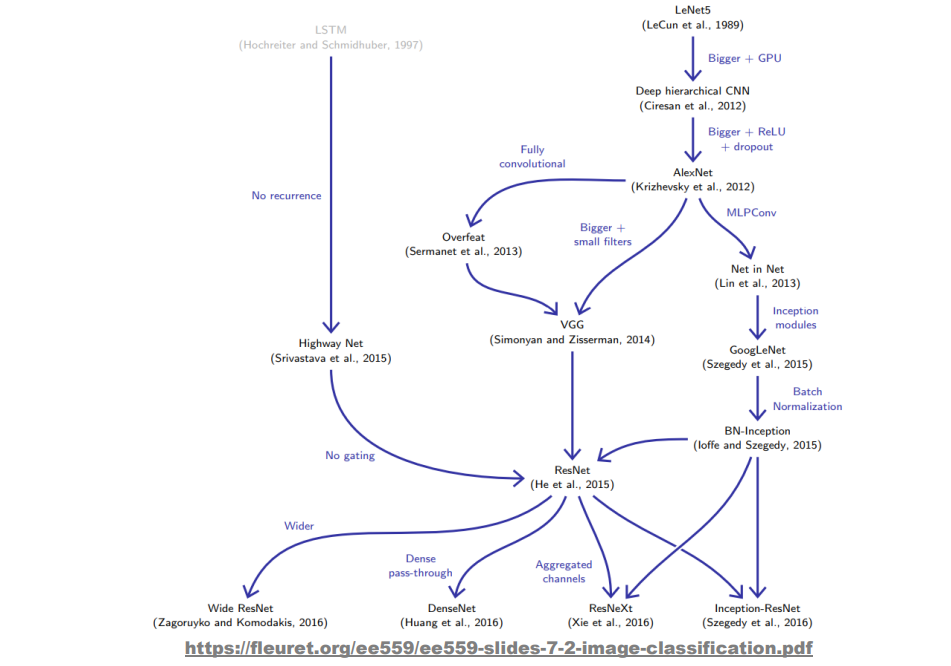

# Main CNN architectures ideas

- stochastic depth
- hyper nets
- scaling up
- Global Average Pooling instead of FC layer
- conv layer with stride > 1 instead of Pooling
- depthwise/pointwise and group convs
- bottleneck and inverted bottleneck
- channel shuffle
- different activation functions
- gradient clipping helps to get rid of normalization
- new tricks can significally improve old nets